# **Advance Computer Vision - Project 2**

- **Face recognition to recognise similar faces. Here, we are particularly interested in recognising whether two given faces are of the same person or not.**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **PART-1**

In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import precision_recall_curve,accuracy_score,f1_score,precision_score,recall_score
import warnings
warnings.filterwarnings('ignore')
import zipfile
import os
import cv2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation
from tensorflow.keras.models import Model
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from IPython.display import HTML
from base64 import b64encode

In [3]:
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/ACV Project 2 Dataset/Dataset Aligned Face Dataset from Pinterest.zip", 'r')
zip_ref.extractall('/content/drive/MyDrive/Dataset/videos')
zip_ref.close()

### **1. Load the dataset and create the metadata.**

In [4]:
class IdentityMetadata():
    def __init__(self, base, name, file):
        self.base = base
        self.name = name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file) 
    
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        for f in os.listdir(os.path.join(path, i)):
            # Check file extension. Allow only jpg/jpeg' files.
            ext = os.path.splitext(f)[1]
            if ext == '.jpg' or ext == '.jpeg':
                metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

metadata = load_metadata('/content/drive/MyDrive/Dataset/videos/PINS')

In [5]:
metadata.shape

(10770,)

### **2. Check some samples of metadata.**

In [6]:
metadata[0:10]

array([/content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul0_262.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul101_247.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul101_248.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul101_249.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul103_217.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul113_228.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul114_271.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul116_240.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul117_213.jpg,
       /content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul119_219.jpg],
      dtype=object)

In [7]:
def load_image(path):
    img = cv2.imread(path, 1)
    return img[...,::-1]

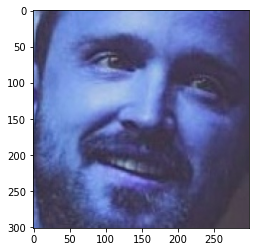

In [8]:
plt.imshow(cv2.imread('/content/drive/MyDrive/Dataset/videos/PINS/pins_Aaron Paul/Aaron Paul0_262.jpg'))

In [9]:
load_image('/content/drive/MyDrive/Dataset/videos/PINS/pins_chadwick boseman face/chadwick boseman face33.jpg')

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

### **3. Load the pre-trained model and weights.**

In [10]:
def vgg_face():	
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(Convolution2D(4096, (7, 7), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(4096, (1, 1), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(2622, (1, 1)))
    model.add(Flatten())
    model.add(Activation('softmax'))
    return model

In [11]:
model = vgg_face()

model.load_weights('/content/drive/MyDrive/Dataset/vgg_face_weights.h5')

In [12]:
model.layers[0], model.layers[-2]

(<tensorflow.python.keras.layers.convolutional.ZeroPadding2D at 0x7f21fc8fce50>,
 <tensorflow.python.keras.layers.core.Flatten at 0x7f21f04bc850>)

In [13]:
vgg_face_descriptor = Model(inputs=model.layers[0].input, outputs=model.layers[-2].output)

In [14]:
vgg_face_descriptor.inputs, vgg_face_descriptor.outputs

([<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'zero_padding2d_input')>],
 [<KerasTensor: shape=(None, 2622) dtype=float32 (created by layer 'flatten')>])

In [15]:
img_path = metadata[0].image_path()
img = load_image(img_path)

img = (img / 255.).astype(np.float32)
img = cv2.resize(img, dsize = (224,224))
print(img.shape)

embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
print(embedding_vector.shape)

(224, 224, 3)
(2622,)


### **4. Generate Embedding vectors for each face in the dataset.**

In [16]:
embeddings = np.zeros((metadata.shape[0], 2622))
for i, m in enumerate(metadata):
    img_path = metadata[i].image_path()
    img = load_image(img_path)
    img = (img / 255.).astype(np.float32)
    img = cv2.resize(img, dsize = (224,224))
    embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
    embeddings[i]=embedding_vector

In [17]:
print('embeddings shape :', embeddings.shape)

embeddings shape : (10770, 2622)


In [18]:
embeddings[0]

array([ 0.03170307, -0.0150513 , -0.01243402, ...,  0.00043141,
        0.00219081, -0.00908097])

### **5. Build distance metrics for identifying the distance between two given images.**

In [19]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

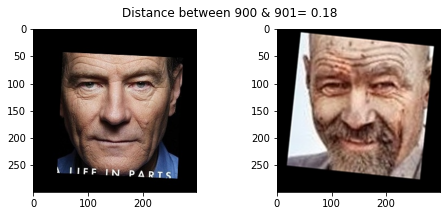

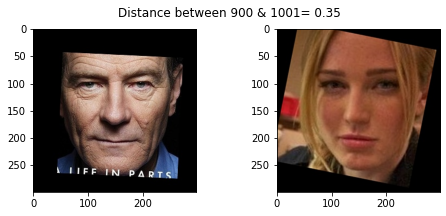

In [20]:
def show_pair(idx1, idx2):
    plt.figure(figsize=(8,3))
    plt.suptitle(f'Distance between {idx1} & {idx2}= {distance(embeddings[idx1], embeddings[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(metadata[idx2].image_path()));    

show_pair(900, 901)
show_pair(900, 1001)

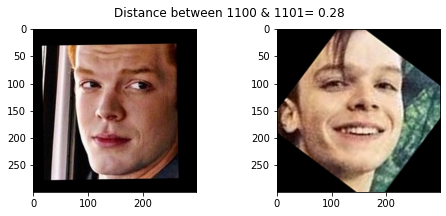

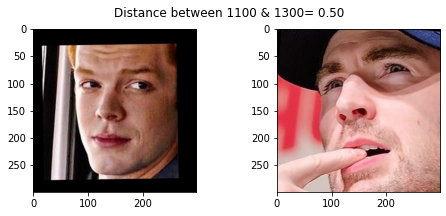

In [21]:
show_pair(1100, 1101)
show_pair(1100, 1300)

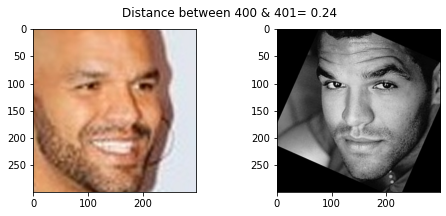

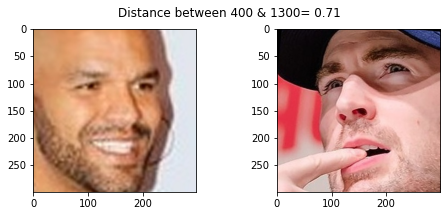

In [60]:
show_pair(400, 401)
show_pair(400, 1300)

In [23]:
train_idx = np.arange(metadata.shape[0]) % 9 != 0   
test_idx = np.arange(metadata.shape[0]) % 9 == 0

X_train = embeddings[train_idx]
X_test = embeddings[test_idx]
targets = np.array([m.name for m in metadata])

y_train = targets[train_idx]
y_test = targets[test_idx]

In [24]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((9573, 2622), (1197, 2622), (9573,), (1197,))

In [25]:
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

In [26]:
print(le.classes_)

['pins_Aaron Paul' 'pins_Alvaro Morte' 'pins_Amanda Crew'
 'pins_Amaury Nolasco' 'pins_Anna Gunn' 'pins_Benedict Cumberbatch'
 'pins_Betsy Brandt' 'pins_Brenton Thwaites' 'pins_Brit Marling'
 'pins_Bryan Cranston' 'pins_Caity Lotz' 'pins_Cameron Monaghan'
 'pins_Chance Perdomo' 'pins_Chris Evans' 'pins_Chris Pratt'
 'pins_Cobie Smulders' 'pins_Danielle Panabaker' 'pins_Dave Franco'
 'pins_Dominic Purcell' 'pins_Dwayne Johnson' 'pins_Emilia Clarke'
 'pins_Emily Bett Rickards' 'pins_Emma Stone' 'pins_Gwyneth Paltrow'
 'pins_Henry Cavil' 'pins_Jason Momoa' 'pins_Jeremy Renner'
 'pins_Jesse Eisenberg' 'pins_Jim Parsons' 'pins_Jon Bernthal'
 'pins_Josh Radnor' 'pins_Kit Harington' 'pins_Krysten Ritter'
 'pins_Kumail Nanjiani' 'pins_Maisie Williams' 'pins_Mark Ruffalo'
 'pins_Martin Starr' 'pins_Melissa benoit' 'pins_Mike Colter'
 'pins_Morena Baccarin' 'pins_Morgan Freeman' 'pins_Natalie Portman '
 'pins_Neil Patrick Harris' 'pins_Paul Rudd' 'pins_Pedro Alonso'
 'pins_Peter Dinklage' 'pins_

In [27]:
y_test_encoded

array([ 0,  0,  0, ..., 99, 99, 99])

In [28]:
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [29]:
X_train_std.shape, X_test_std.shape, y_train_encoded.shape, y_test_encoded.shape

((9573, 2622), (1197, 2622), (9573,), (1197,))

### **6. Use PCA for dimensionality reduction.**

In [30]:
pca = PCA(n_components=128)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

### **7. Build an SVM classifier to map each image to its right person.**

In [31]:
clf = SVC(C=5., gamma=0.001)
clf.fit(X_train_pca, y_train_encoded)

SVC(C=5.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

### **8. Predict using the SVM model.**

In [32]:
y_predict = clf.predict(X_test_pca)
y_predict

array([ 0,  0,  0, ..., 99, 99, 99])

In [33]:
y_predict_encoded = le.inverse_transform(y_predict)
y_predict_encoded

array(['pins_Aaron Paul', 'pins_Aaron Paul', 'pins_Aaron Paul', ...,
       'pins_zendaya', 'pins_zendaya', 'pins_zendaya'], dtype='<U29')

In [34]:
accuracy_score(y_test_encoded, y_predict)

0.9507101086048454

In [35]:
def result(example_idx):
  example_image = load_image(metadata[test_idx][example_idx].image_path())
  example_prediction = y_predict[example_idx]
  example_identity =  y_predict_encoded[example_idx]
  return plt.imshow(example_image),plt.title(f'Identified as {example_identity}')

(<matplotlib.image.AxesImage at 0x7f219c2db150>,
 Text(0.5, 1.0, 'Identified as pins_Aaron Paul'))

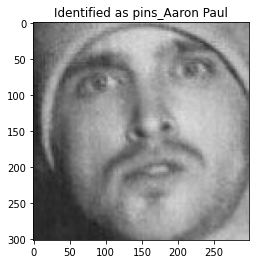

In [36]:
result(1)

(<matplotlib.image.AxesImage at 0x7f210357c710>,
 Text(0.5, 1.0, 'Identified as pins_Bryan Cranston'))

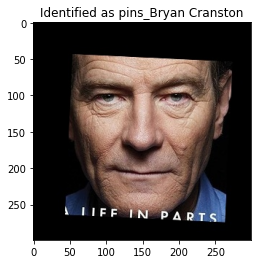

In [37]:
result(100)

(<matplotlib.image.AxesImage at 0x7f219c1f6350>,
 Text(0.5, 1.0, 'Identified as pins_anne hathaway'))

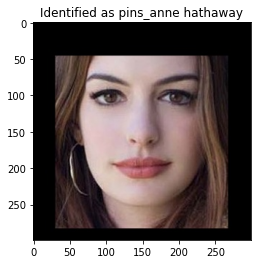

In [79]:
result(800)

# **PART-2**

- **Create an automation using computer vision to impute dynamic bounding boxes to locate cars or vehicles on the road.**

## **1st approach: Detecting video object with openCV**

In [39]:
np.random.seed(42)

def fixColor(image):
    return(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [40]:
video_stream = cv2.VideoCapture('/content/drive/MyDrive/Dataset/videos/overpass_DQNd5EOb.mp4')

# Randomly select 30 frames
frameIds = video_stream.get(cv2.CAP_PROP_FRAME_COUNT) * np.random.uniform(size=30)

# Store selected frames in an array
frames = []
for fid in frameIds:
    video_stream.set(cv2.CAP_PROP_POS_FRAMES, fid)
    ret, frame = video_stream.read()
    frames.append(frame)
    
video_stream.release()

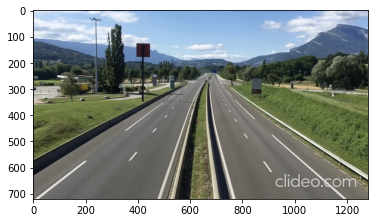

In [41]:
medianFrame = np.median(frames, axis=0).astype(dtype=np.uint8)
plt.imshow(fixColor(medianFrame))

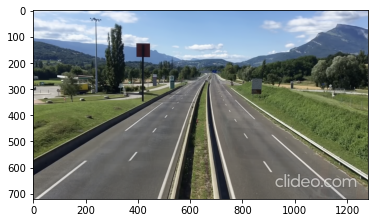

In [42]:
avgFrame = np.average(frames, axis=0).astype(dtype=np.uint8)
plt.imshow(fixColor(avgFrame))

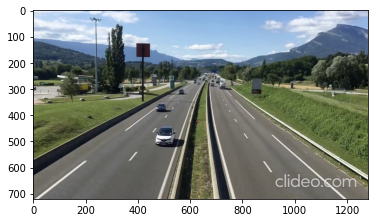

In [43]:
sample_frame=frames[10]
plt.imshow(fixColor(sample_frame))

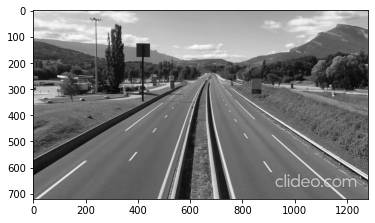

In [44]:
grayMedianFrame = cv2.cvtColor(medianFrame, cv2.COLOR_BGR2GRAY)
plt.imshow(fixColor(grayMedianFrame))

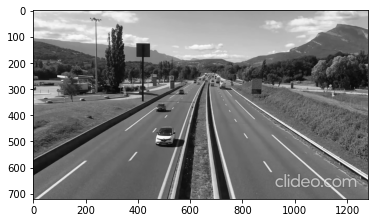

In [45]:
graySample=cv2.cvtColor(sample_frame, cv2.COLOR_BGR2GRAY)
plt.imshow(fixColor(graySample))

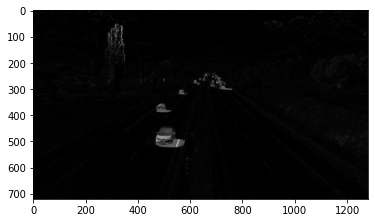

In [46]:
dframe = cv2.absdiff(graySample, grayMedianFrame)
plt.imshow(fixColor(dframe))

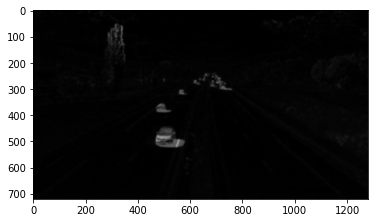

In [47]:
blurred = cv2.GaussianBlur(dframe, (11,11), 0)
plt.imshow(fixColor(blurred))

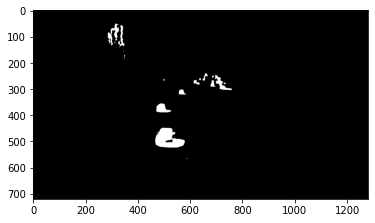

In [48]:
ret, tframe= cv2.threshold(blurred,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(fixColor(tframe))

In [49]:
(cnts, _) = cv2.findContours(tframe.copy(), cv2.RETR_EXTERNAL, 
                             cv2 .CHAIN_APPROX_SIMPLE)

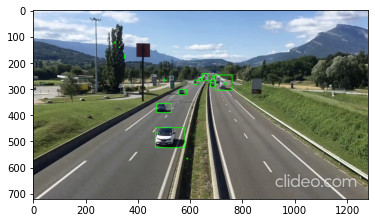

In [50]:
for cnt in cnts:
    x,y,w,h = cv2.boundingRect(cnt)
    if y>100:
      cv2.rectangle(sample_frame,(x,y),(x+w,y+h),(0,255,0),2)

plt.imshow(fixColor(sample_frame))

In [51]:
writer = cv2.VideoWriter("output.mp4",cv2.VideoWriter_fourcc(*"MP4V"), 30,(640,480))

In [52]:
video_stream = cv2.VideoCapture('/content/drive/MyDrive/Dataset/videos/overpass_DQNd5EOb.mp4')
total_frames=video_stream.get(cv2.CAP_PROP_FRAME_COUNT)
total_frames

812.0

In [53]:
frameCnt=0
while(frameCnt < total_frames-1):

    frameCnt+=1
    ret, frame = video_stream.read()

    # Convert current frame to grayscale
    gframe = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # Calculate absolute difference of current frame and
    # the median frame
    dframe = cv2.absdiff(gframe, grayMedianFrame)
    # Gaussian
    blurred = cv2.GaussianBlur(dframe, (11, 11), 0)
    #Thresholding to binarise
    ret, tframe= cv2.threshold(blurred,0,255,
                               cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    #Identifying contours from the threshold
    (cnts, _) = cv2.findContours(tframe.copy(), 
                                 cv2.RETR_EXTERNAL, cv2 .CHAIN_APPROX_SIMPLE)
    #For each contour draw the bounding bos
    for cnt in cnts:
        x,y,w,h = cv2.boundingRect(cnt)
        if y>100: # Disregard items in the top of the picture
          cv2.rectangle(frame,(x,y),(x+w,y+h),(0,0,255),2)

    writer.write(cv2.resize(frame, (640,480)))
 
#Release video object
video_stream.release()
writer.release()

In [54]:
# Input video path
save_path = "/content/output.mp4"

# Compressed video path
compressed_path = "/content/video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## **2nd approach: Detecting video object with train dataset**

In [55]:
cap = cv2.VideoCapture('/content/drive/MyDrive/Dataset/videos/video1_1.mp4')
car_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Dataset/videos/cars.xml')

In [56]:
writer = cv2.VideoWriter("output2.mp4", cv2.VideoWriter_fourcc(*"MP4V"), 30,(300,200))

video_stream = cv2.VideoCapture('/content/drive/MyDrive/Dataset/videos/video1_1.mp4')
total_frames=video_stream.get(cv2.CAP_PROP_FRAME_COUNT)
total_frames

2648.0

In [57]:
frameCnt=0
while(frameCnt < total_frames-1):
  frameCnt+=1
  ret, frames = cap.read()
  gray = cv2.cvtColor(frames, cv2.COLOR_BGR2GRAY)
  cars = car_cascade.detectMultiScale( gray, 1.1, 1)
  for (x,y,w,h) in cars:
    cv2.rectangle(frames,(x,y),(x+w,y+h),(0,0,255),2)
    font = cv2.FONT_HERSHEY_DUPLEX
    cv2.putText(frames, 'Car', (x + 6, y - 6), font, 0.5, (0, 0, 255), 1)
  writer.write(cv2.resize(frames, (300,200)))
 
video_stream.release()
writer.release()

In [58]:
# Input video path
save_path = "/content/output2.mp4"

# Compressed video path
compressed_path = "/content/video_compressed_2.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)